In [1]:
# Loading libraries
%matplotlib inline
import os
import os.path
from netCDF4 import Dataset
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc 
import fnmatch
from cycler import cycler
import pandas as pd
from pandas import read_csv, to_datetime, DataFrame
import datetime
import time
import matplotlib.dates as mdates

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from mpl_toolkits.basemap import Basemap # Basemap pour les cartes

In [2]:
# LOADING GRID FILE AND VARIABLES
!pwd
grid_file = '../DATA/grille.nc' 
print 'file exist:', os.path.isfile(grid_file)

f = Dataset(grid_file) # open netcdf
# extracting variables
lon_t = f.variables['longitude_t'][:] # extracting lon data
lat_t = f.variables['latitude_t'][:] # extracting lat data
depth_t = f.variables['depth_t'][:]
bathy = f.variables['h_w'][:]
print 'Bathy :', np.shape(bathy), 'max :', np.max(bathy), 'min :', np.min(bathy)

f.close()

new_bath = np.ma.masked_where(bathy<200, bathy)

/home/dosa/MON_ENV_PYTHON/IAV
file exist: True
Bathy : (160, 394) max : 5054.49 min : 20.5226


In [3]:
file_path = "./ANNUEL_BIOMETEOPHY/"
list_ann_files = os.listdir(file_path)
#list_ann_files

In [4]:
mld_arr = np.zeros([160,394,33])
mld_arr[:] = np.nan

export_nit_sw = np.zeros([160,394,33])
export_nit_sw[:] = np.nan

corr_map = np.zeros([160,394])
corr_map[:] = np.nan

z = 0

for curr_file in list_ann_files:
    f = Dataset(file_path+curr_file)
    temp_mld = f.variables['mld_dens'][0,:,:]
    temp_exp_nit_sw = f.variables['export_nit_sw'][0,:,:]
    
    mld_arr[:,:,z] = temp_mld
    export_nit_sw[:,:,z] = temp_exp_nit_sw
    
    temp_mld = []
    temp_exp_nit_sw = []
    
    z += 1
    
    f.close()

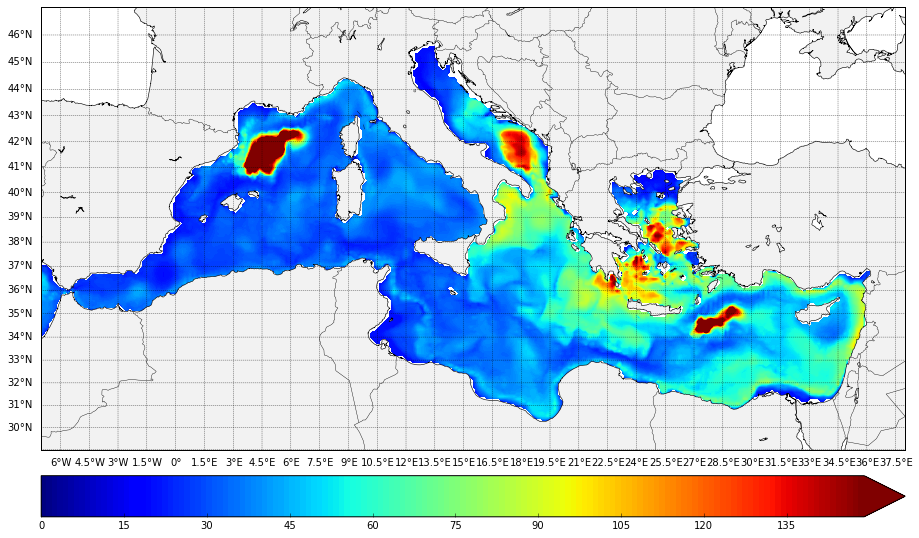

In [5]:
# Example
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
    
# Creating corresponding variable names
data_to_plot = mld_arr[:,:,32]
#data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

# doing a map

# Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(0,150,1);
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet, extend='max');# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

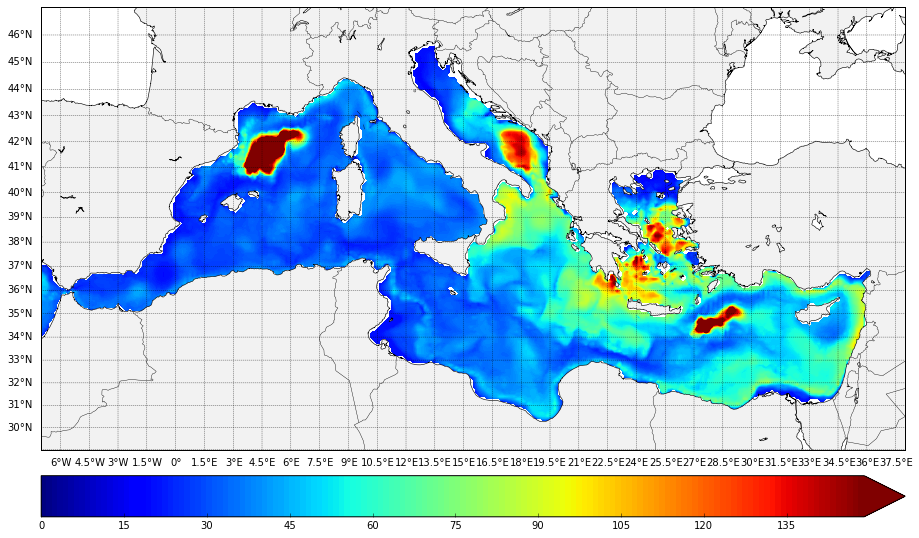

In [21]:
# Example
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
    
# Creating corresponding variable names
data_to_plot = temp_mld
#data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

# doing a map

# Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(0,150,1);
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet, extend='max');# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

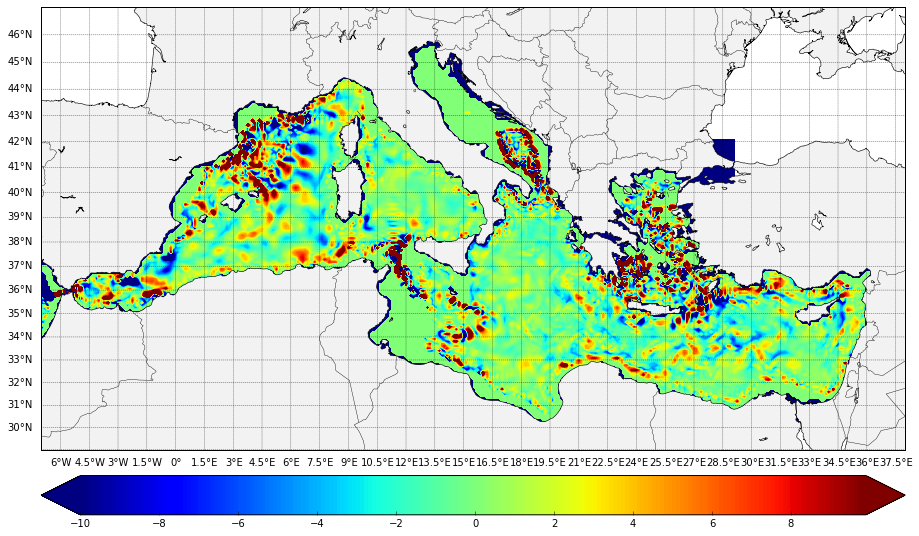

In [9]:
# Example
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
    
# Creating corresponding variable names
data_to_plot = export_nit_sw[:,:,32]
#data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

# doing a map

# Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-10,10,0.1);
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet,extend='both');# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

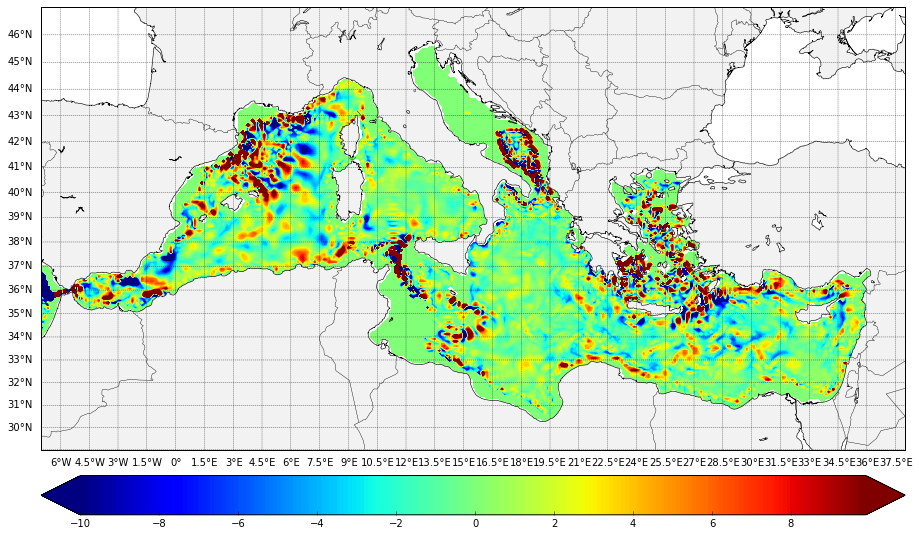

In [52]:
# Example
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
    
# Creating corresponding variable names
data_to_plot = temp_exp_nit_sw
#data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

# doing a map

# Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-10,10,0.1);
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet, extend='both');# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

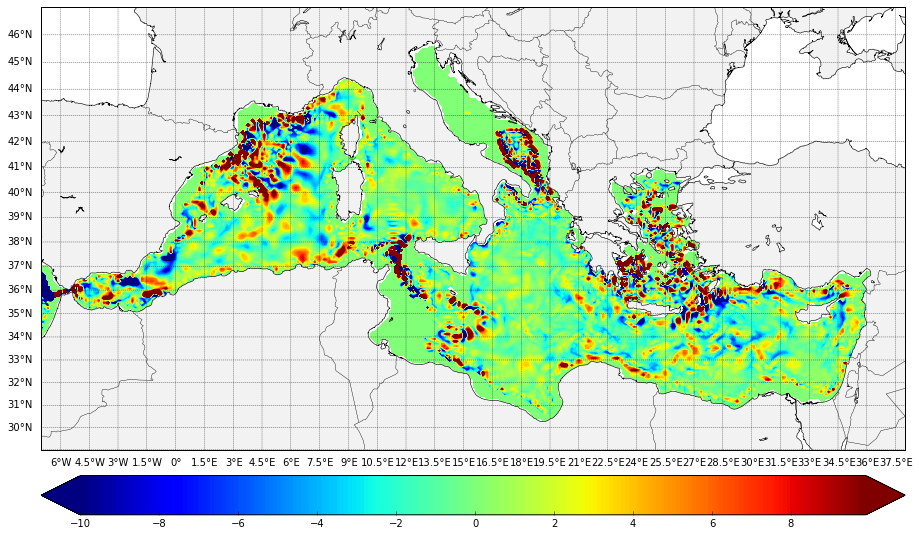

In [23]:
# Example
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
    
# Creating corresponding variable names
data_to_plot = temp_exp_nit_sw
#data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

# doing a map

# Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-10,10,0.1);
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet, extend='both');# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

In [10]:
import scipy.stats as scp_stats

for i in np.arange(0,160):
    for j in np.arange(0,394):
        corr_map[i,j] = scp_stats.spearmanr(mld_arr[i,j,:], export_nit_sw[i,j,:])[0]
        
print 'END of CELL'

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/numpy/lib/function_base.py:2569: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1754: RuntimeWarning: invalid value encountered in greater
  cond1 = (scale > 0) & (x > self.a) & (x < self.b)
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1754: RuntimeWarning: invalid value encountered in less
  cond1 = (scale > 0) & (x > self.a) & (x < self.b)
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1755: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/numpy/lib/function_base.py:2570: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


END of CELL


In [44]:
mld_arr[80,150,:]

array([ 35.14366913,  35.02907562,  30.74798203,  31.32541275,
        33.47776794,  29.51019478,  30.59771729,  30.10162544,
        27.10029984,  29.93949699,  28.43688965,  32.53456879,
        33.23529816,  27.78283119,  31.30961037,  29.96233368,
        28.48286438,  31.037323  ,  29.24544716,  30.60907364,
        28.00024796,  29.88780594,  28.50762558,  27.85487938,
        30.59612846,  31.45648193,  32.22867584,  28.89354897,
        33.2339325 ,  32.41662216,  34.76308441,  29.39546967,  35.17650986])

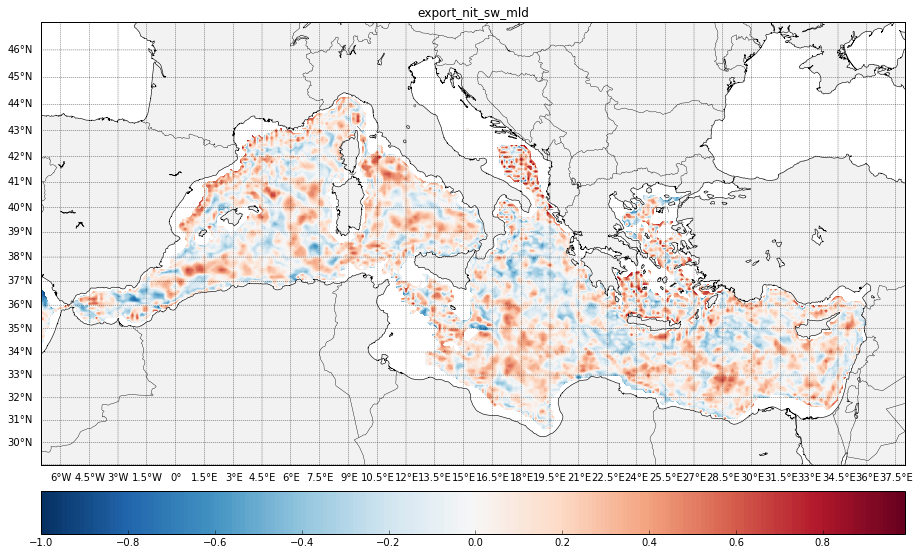

In [21]:
# Example
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
    
# Creating corresponding variable names
data_to_plot = corr_map
#data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

# doing a map

# Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1,0.01);
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdBu_r);# binary / jet 

plt.colorbar(cs, orientation='horizontal', pad = 0.03)
plt.title('export_nit_sw_mld')
plt.savefig('/home/dosa/THESE/CR_reunions/JULY_FIGS/IAV_CORR_MAPS/'+biovar+'_'+phyvar+'_versAlex.png',bbox_inches='tight',format='png')

file exist: True
END of CELL


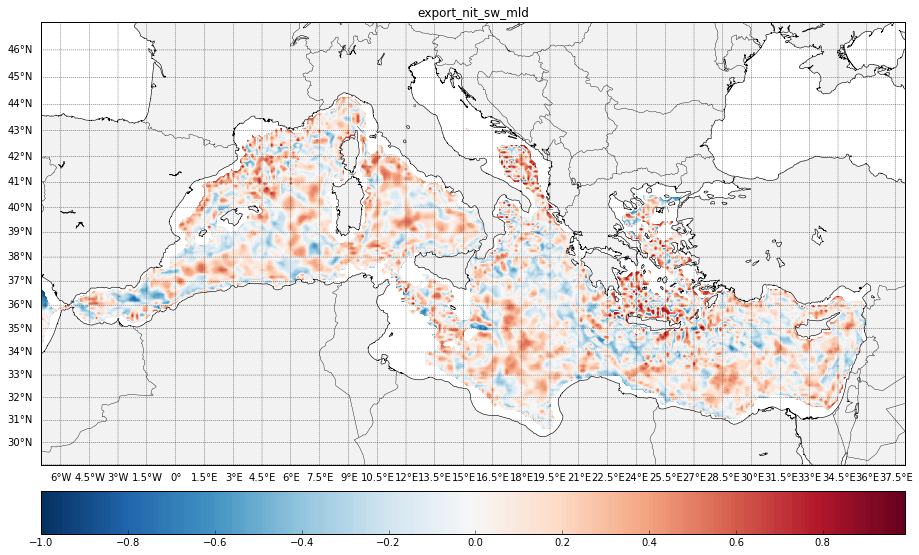

In [20]:
var_bio = ['export_nit_sw'] # new vers
var_phy = ['mld'] # new vers

correl_1 = './CORREL_1_2011.nc' # new vers
print 'file exist:', os.path.isfile(correl_1)

f = Dataset(correl_1) # open netcdf
for phyvar in var_phy:
    for biovar in var_bio:
        vars()[biovar+'_'+phyvar] = f.variables[biovar+'_'+phyvar][0,:,:]# extracting data

f.close()
        
for phyvar in var_phy:
    for biovar in var_bio:
        x1,x2,y1,y2 = -7, 38, 29, 47;
        m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
                    # figure
        fig = plt.figure(figsize=(15,15));
        ax = fig.add_axes([0.1,0.1,0.8,0.8]);
        m.drawcountries(linewidth=0.4);
        m.drawcoastlines(linewidth=0.6);
        m.fillcontinents(color='0.95',lake_color='white');
        parallels = np.arange(0.,81,1);
        m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
        meridians = np.arange(-6.,351.,1.5);
        m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

        # Creating corresponding variable names
        data_to_plot = vars()[biovar+'_'+phyvar]

        # doing a map # Données
        xd,yd = m(lon_t,lat_t);
        levels = np.arange(-1,1,0.01);
        cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdBu_r);
        plt.colorbar(cs, orientation='horizontal', pad = 0.03)
        plt.title(biovar+'_'+phyvar)
        plt.savefig('/home/dosa/THESE/CR_reunions/JULY_FIGS/IAV_CORR_MAPS/'+biovar+'_'+phyvar+'_versClaude.png',bbox_inches='tight',format='png')

print 'END of CELL'

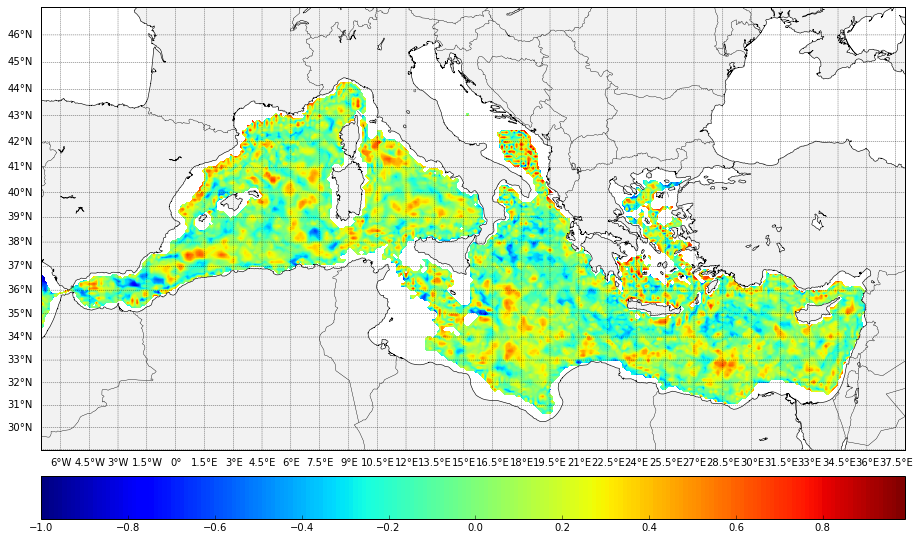

In [47]:
# Example
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
    
# Creating corresponding variable names
data_to_plot = corr_map
#data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

# doing a map

# Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1,0.01);
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet);# binary / jet 

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

In [76]:
#var_bio = ['ppb', 'netppb', 'export_poc200', 'export_doc200', 'export_nit_sw', 'export_nit_iw', 'chlsurf'] 
var_bio = ['ppb', 'ppb-resp', 'netppb', 'export_poc200', 'export_doc200', 'export_nit_sw', 'export_nit_iw', 'chlsurf'] # new vers
#var_phy = ['snsf', 'ssr', 'sst', 'stra', 'mld']
var_phy = ['snsf', 'ssr', 'sst', 'str2', 'strf', 'mld'] # new vers

#correl_1 = './CORREL_1_2012.nc' 
correl_1 = './CORREL_1_2011.nc' # new vers
print 'file exist:', os.path.isfile(correl_1)

f = Dataset(correl_1) # open netcdf
for phyvar in var_phy:
    for biovar in var_bio:
        if biovar == 'ppb-resp':
            vars()['NCP_'+phyvar] = f.variables[biovar+phyvar][0,:,:]# extracting data
        else:
            vars()[biovar+'_'+phyvar] = f.variables[biovar+'_'+phyvar][0,:,:]# extracting data
#ppb_snsf = f.variables['ppb_snsf'][0,:,:] # extracting data

f.close()

np.shape(netppb_mld) # (160, 394) seems ok!

# Removing non significant values
for phyvar in var_phy:
    for biovar in var_bio:
        if biovar == 'ppb-resp':
            vars()['NCP_'+phyvar][(vars()['NCP_'+phyvar]>-0.33)&(vars()['NCP_'+phyvar]<0.33)] = np.nan
        else:
            vars()[biovar+'_'+phyvar][(vars()[biovar+'_'+phyvar]>-0.33)&(vars()[biovar+'_'+phyvar]<0.33)] = np.nan
        
print 'END of CELL'

file exist: True
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:26: RuntimeWarning: invalid value encountered in greater
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:26: RuntimeWarning: invalid value encountered in less


In [81]:
# Correlations between forcings
#correl_forcing = './CORREL_FORCING_2012.nc'
correl_forcing = './CORREL_FORCING_2011.nc' # new vers
print 'file exist:', os.path.isfile(correl_forcing)

f = Dataset(correl_forcing) # open netcdf
snsf_ssr = f.variables['correl_snsf_ssr'][0,:,:]# extracting data
ssr_strat = f.variables['correl_ssr_strat'][0,:,:]# extracting data
snsf_strat = f.variables['correl_snsf_strat'][0,:,:]# extracting data
snsf_mld = f.variables['correl_snsf_mld'][0,:,:]# extracting data

f.close()

np.shape(snsf_ssr) # (160, 394) seems ok!

file exist: True


(160, 394)

In [87]:
# CORREL_2_2012.nc
var_other = ['bactc', 'chl_tot', 'phyto', 'zoo', 'poc', 'doc']
#var_phy = ['snsf', 'ssr', 'sst', 'stra', 'mld']
var_phy = ['snsf', 'ssr', 'sst', 'strf', 'str2', 'mld'] # new vers

#correl_2 = './CORREL_2_2012.nc' # new vers
correl_2 = './CORREL_2_2011.nc'
print 'file exist:', os.path.isfile(correl_2)

f = Dataset(correl_2) # open netcdf
for phyvar in var_phy:
    for othervar in var_other:
        vars()[othervar+'_'+phyvar] = f.variables[othervar+'_'+phyvar][0,:,:]# extracting data

f.close()

np.shape(chl_tot_snsf) # (160, 394) seems ok!

# Removing non significant values
for phyvar in var_phy:
    for othervar in var_other:
        vars()[othervar+'_'+phyvar][(vars()[othervar+'_'+phyvar]>-0.33)&(vars()[othervar+'_'+phyvar]<0.33)] = np.nan
        
print 'END of CELL'

file exist: True
END of CELL


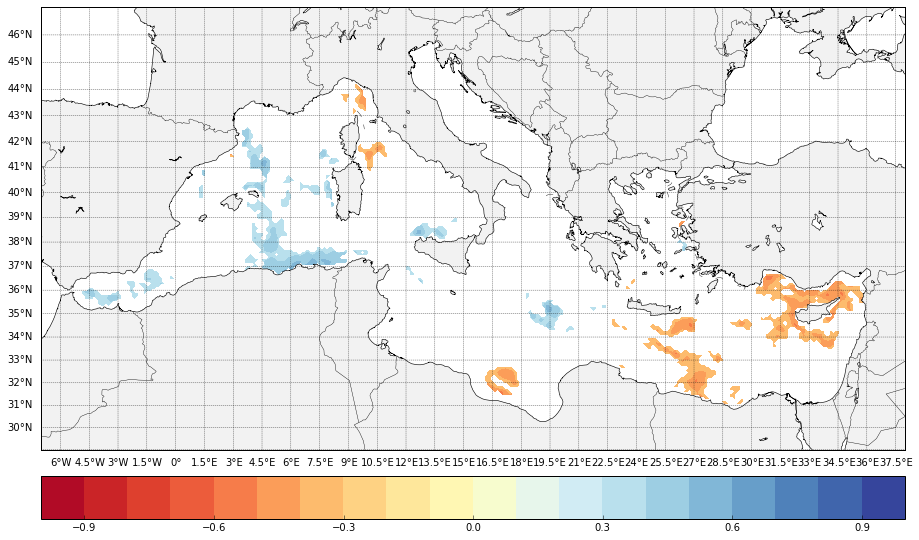

In [39]:
# Example
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
    
# Creating corresponding variable names
data_to_plot = np.ma.masked_where(bathy<200,ppb_snsf)
data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

# doing a map

# Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.1,0.1);
levels2 = np.arange(-1,1.1,0.2);
#CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.2,colors='k');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu);# binary / jet ,levels=levels

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

END of CELL


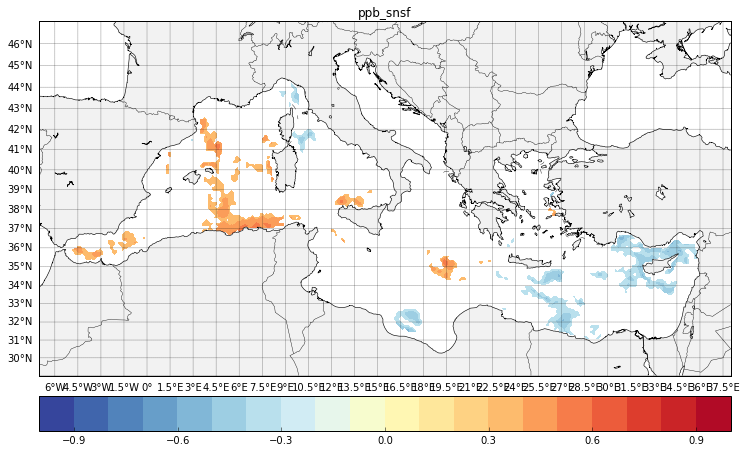

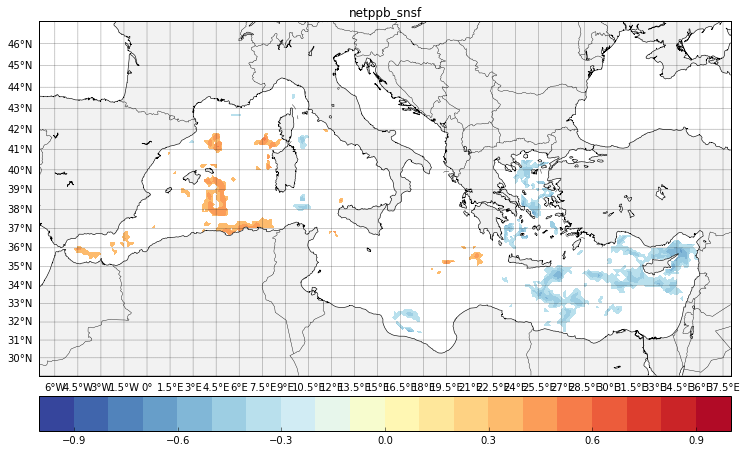

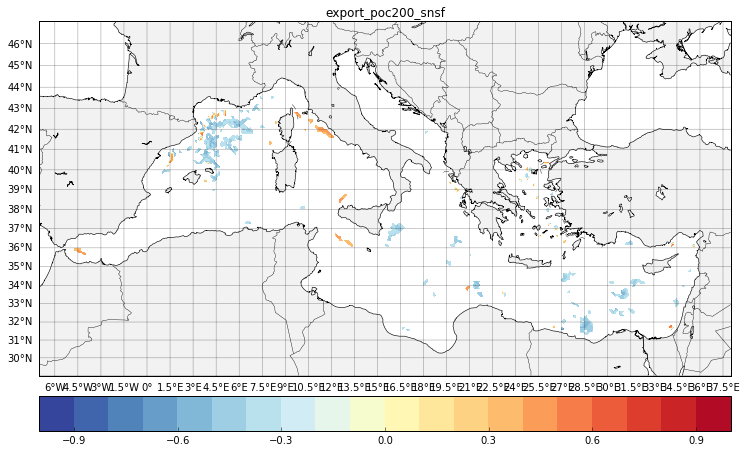

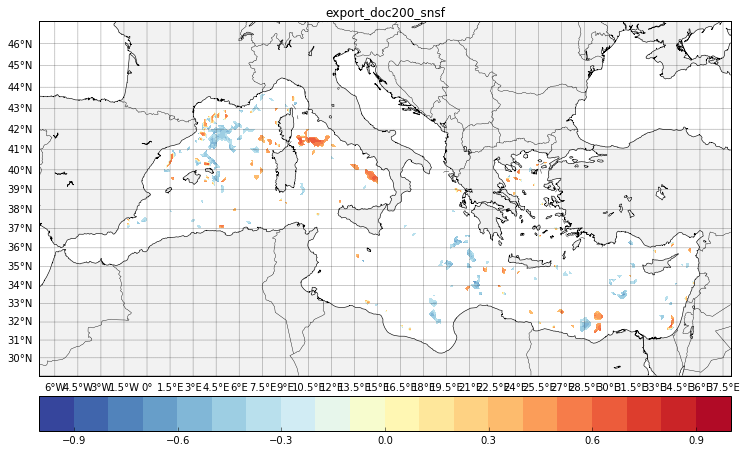

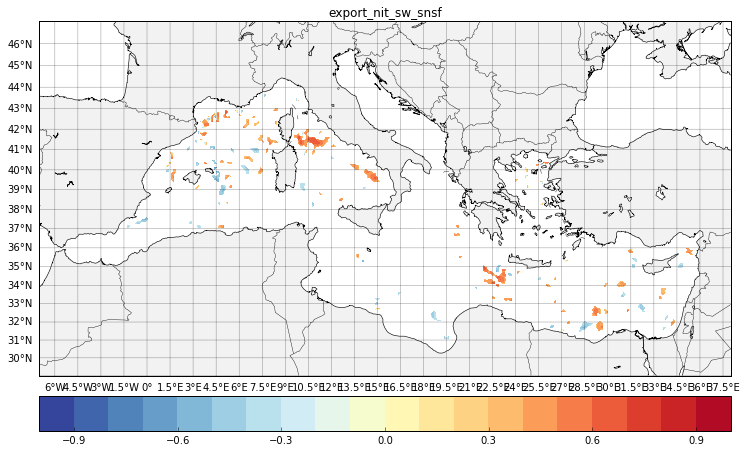

...

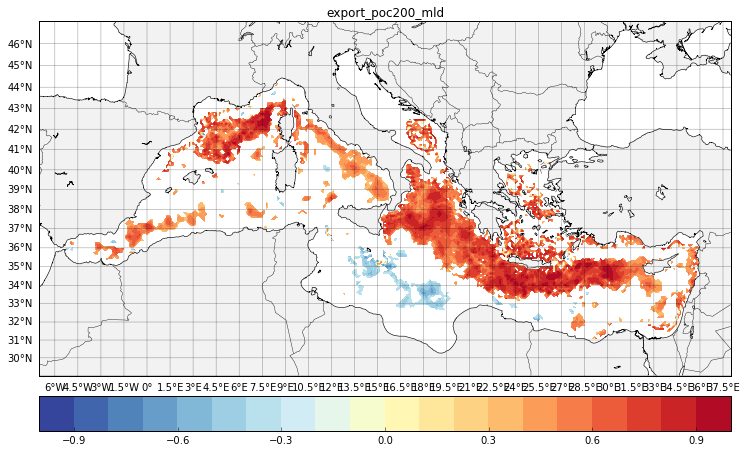

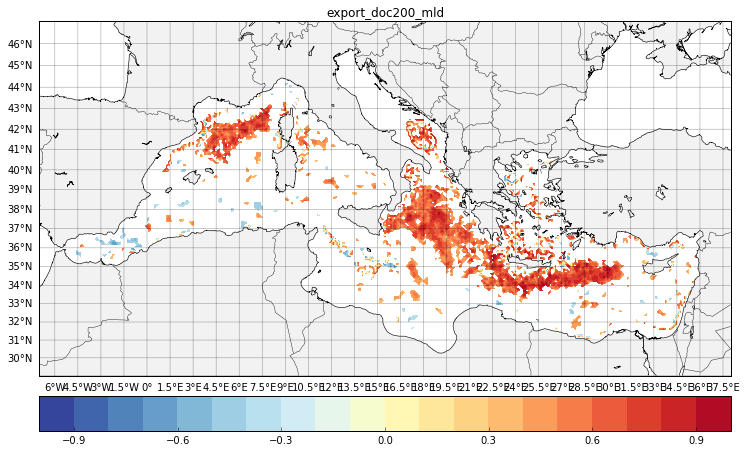

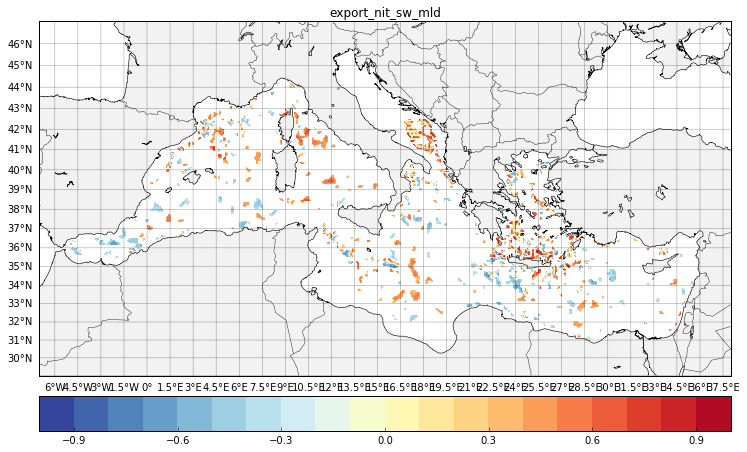

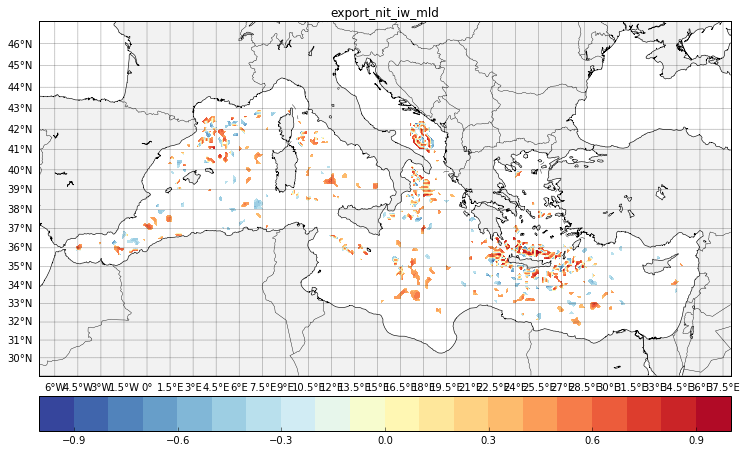

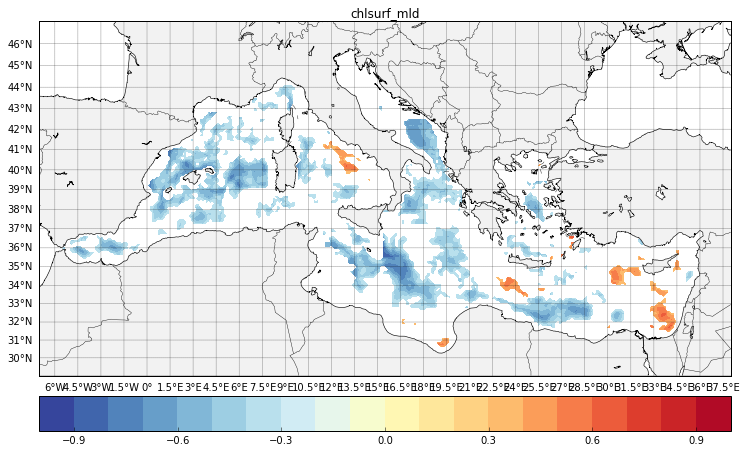

In [77]:
#var_bio = ['ppb', 'NCP', 'netppb', 'export_poc200', 'export_doc200', 'export_nit_sw', 'export_nit_iw', 'chlsurf']

for phyvar in var_phy:
    for biovar in var_bio:
        x1,x2,y1,y2 = -7, 38, 29, 47;
        m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
                    # figure
        fig = plt.figure(figsize=(12,12));
        ax = fig.add_axes([0.1,0.1,0.8,0.8]);
        m.drawcountries(linewidth=0.4);
        m.drawcoastlines(linewidth=0.6);
        m.fillcontinents(color='0.95',lake_color='white');
        parallels = np.arange(0.,81,1);
        m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
        meridians = np.arange(-6.,351.,1.5);
        m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

        # Creating corresponding variable names
        data_to_plot = np.ma.masked_where(bathy<200,vars()[biovar+'_'+phyvar])
        data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

        # doing a map # Données
        xd,yd = m(lon_t,lat_t);
        levels = np.arange(-1,1.1,0.1);
        #levels2 = np.arange(-1,1.1,0.2);
        #CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.2,colors='k');
        cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlGn_r);# binary / jet ,levels=levels
        plt.colorbar(cs, orientation='horizontal', pad = 0.03)
        plt.title(biovar+'_'+phyvar)
        plt.savefig('/home/dosa/THESE/CR_reunions/JULY_FIGS/IAV_CORR_MAPS/'+biovar+'_'+phyvar+'2.png',bbox_inches='tight',format='png')

print 'END of CELL'

END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in greater
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in less


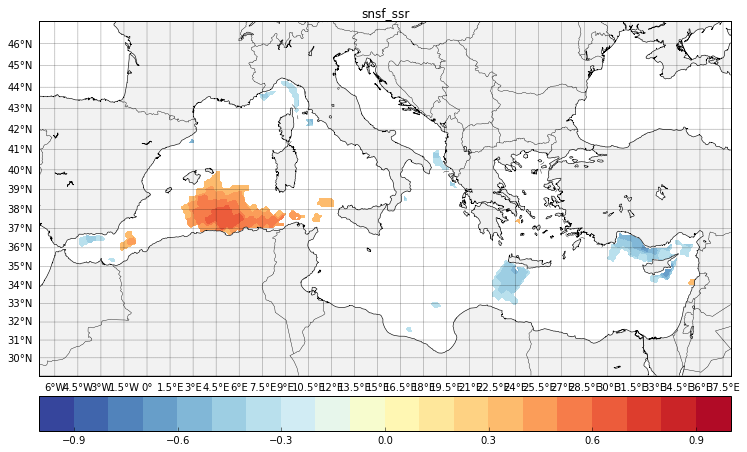

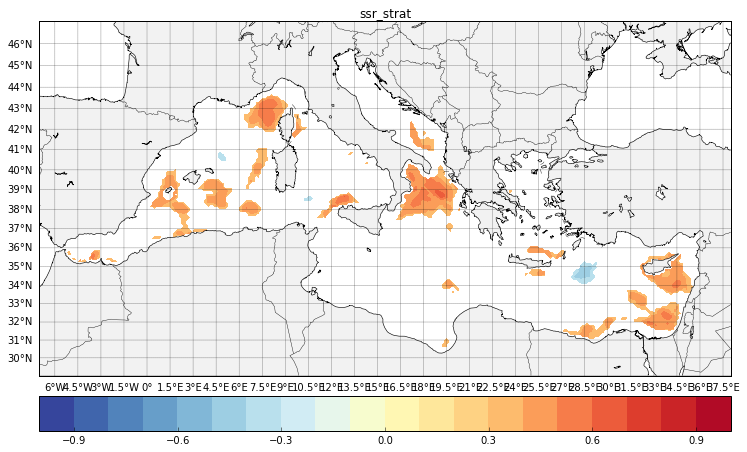

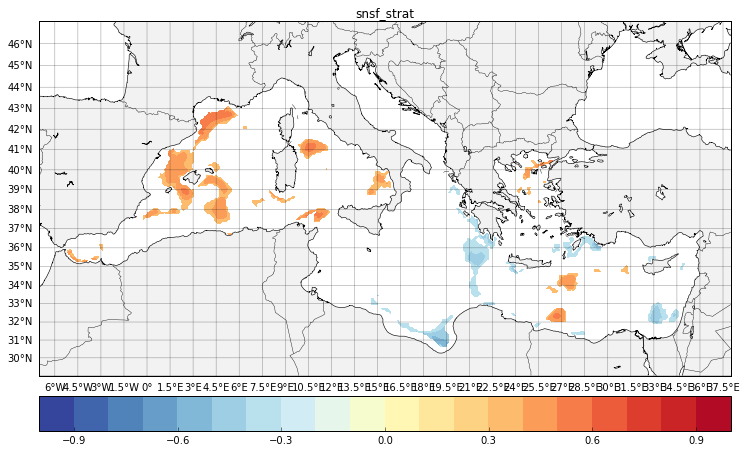

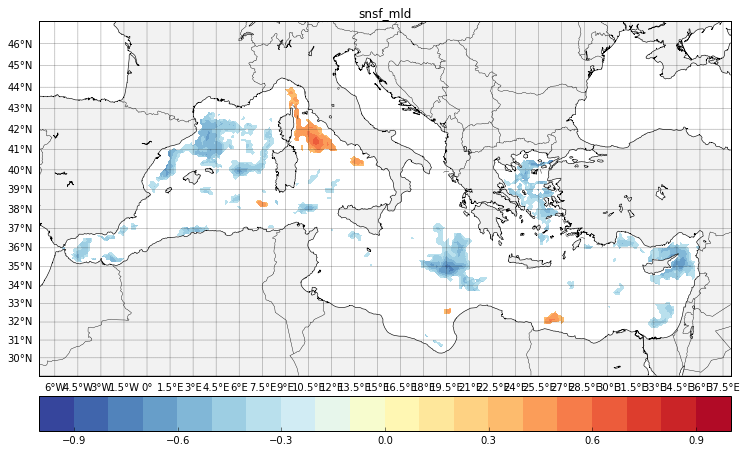

In [83]:
# CORRELATION_FORCING
forcing_corr_list = ['snsf_ssr','ssr_strat','snsf_strat','snsf_mld']

for forcing_corr in forcing_corr_list:
    vars()[forcing_corr][(vars()[forcing_corr]>-0.33)&(vars()[forcing_corr]<0.33)] = np.nan
    
    x1,x2,y1,y2 = -7, 38, 29, 47;
    m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
                    # figure
    fig = plt.figure(figsize=(12,12));
    ax = fig.add_axes([0.1,0.1,0.8,0.8]);
    m.drawcountries(linewidth=0.4);
    m.drawcoastlines(linewidth=0.6);
    m.fillcontinents(color='0.95',lake_color='white');
    parallels = np.arange(0.,81,1);
    m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
    meridians = np.arange(-6.,351.,1.5);
    m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

    # Creating corresponding variable names
    data_to_plot = np.ma.masked_where(bathy<200,vars()[forcing_corr])
    data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

    # doing a map # Données
    xd,yd = m(lon_t,lat_t);
    levels = np.arange(-1,1.1,0.1);
    #levels2 = np.arange(-1,1.1,0.2);
    #CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.2,colors='k');
    cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlGn_r);# binary / jet / RdYlGn ,levels=levels 
    plt.colorbar(cs, orientation='horizontal', pad = 0.03)
    plt.title(forcing_corr)
    plt.savefig('/home/dosa/THESE/CR_reunions/JULY_FIGS/IAV_CORR_MAPS/'+forcing_corr+'2.png',bbox_inches='tight',format='png')

print 'END of CELL'

END of CELL


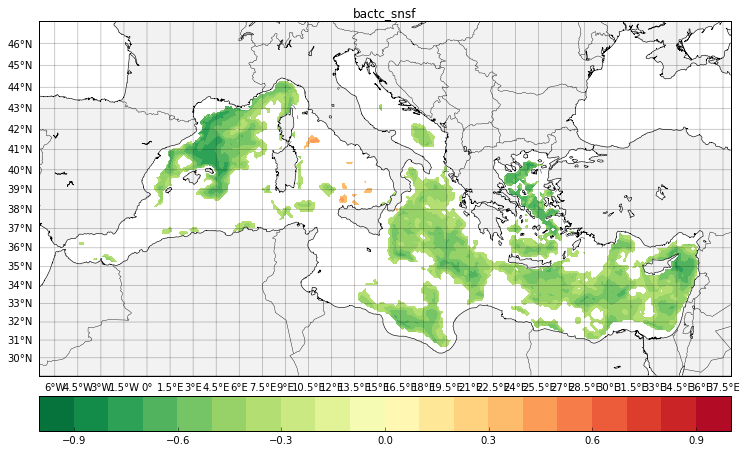

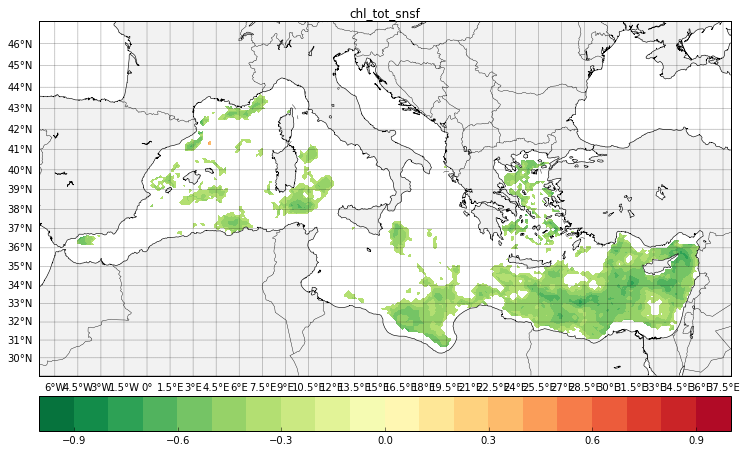

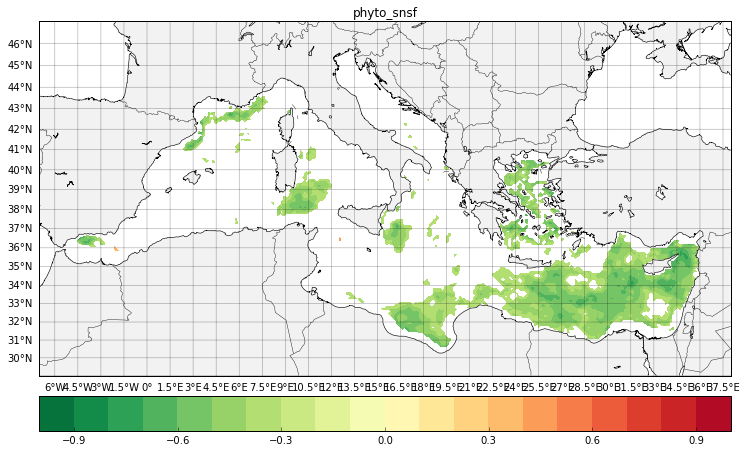

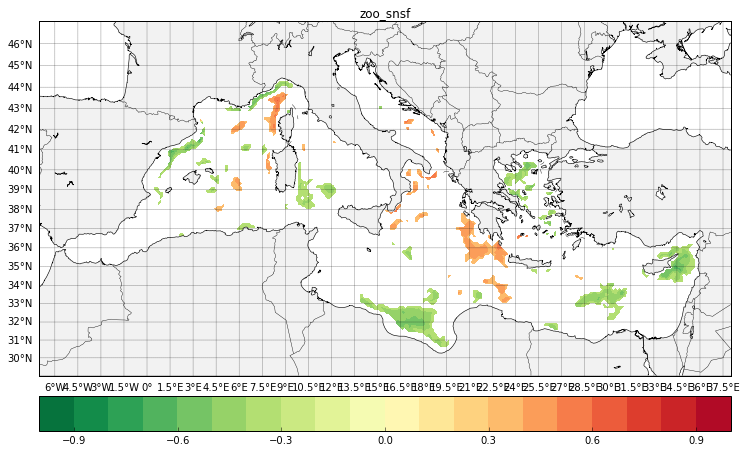

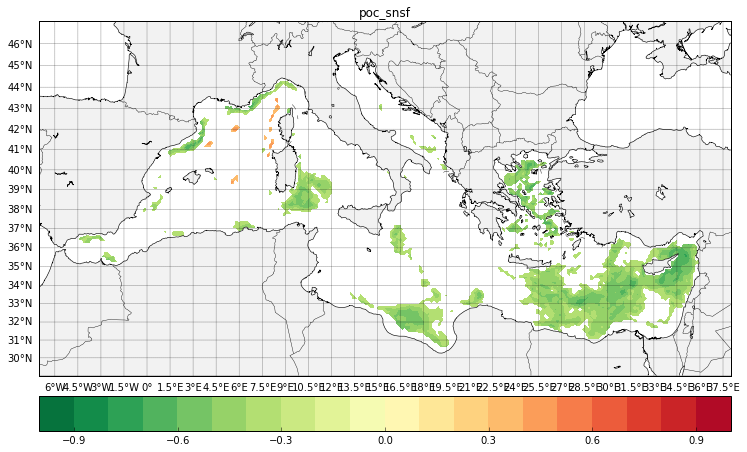

...

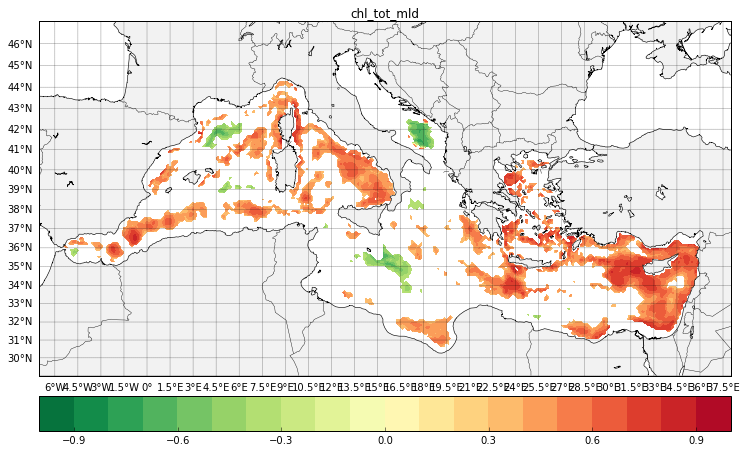

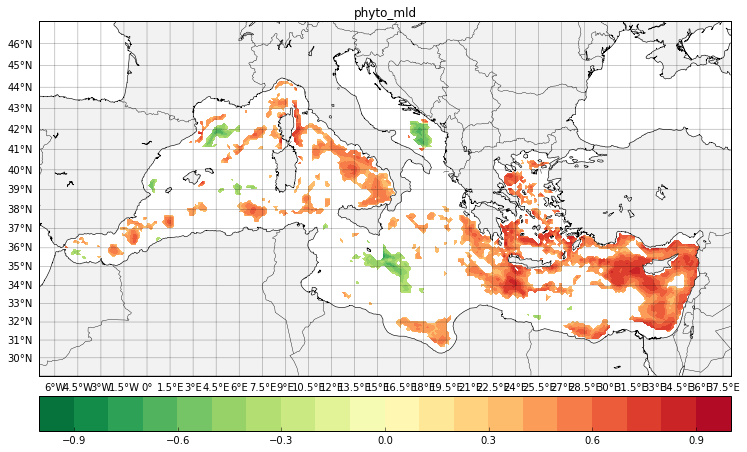

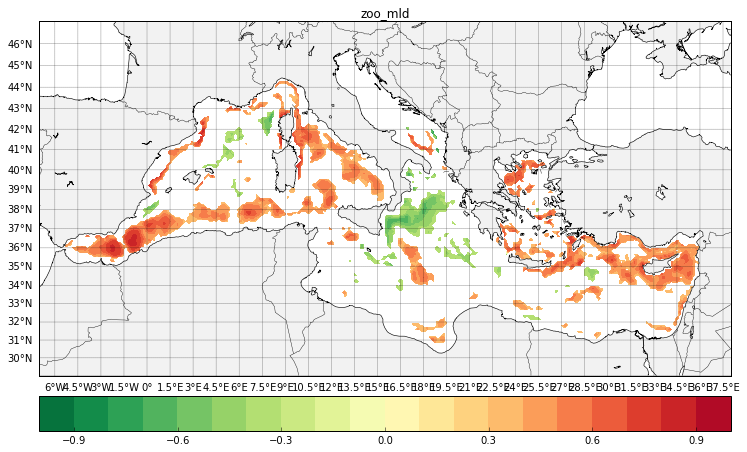

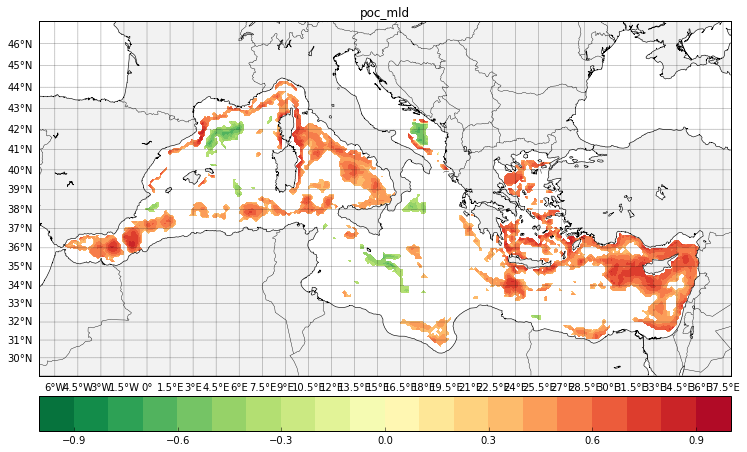

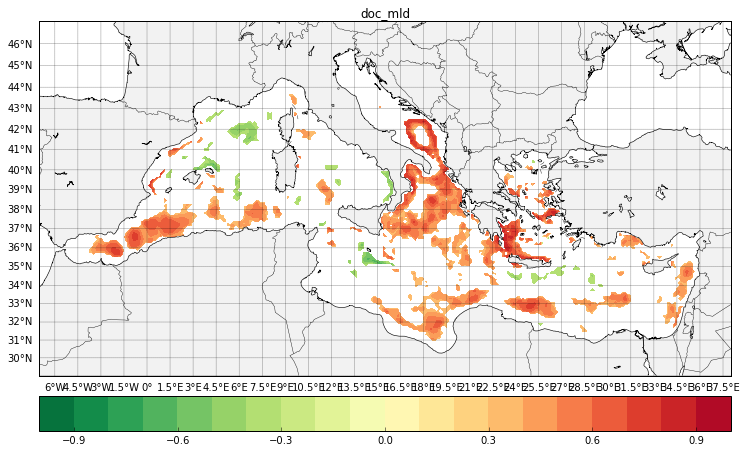

In [88]:
for phyvar in var_phy:
    for othervar in var_other:
        x1,x2,y1,y2 = -7, 38, 29, 47;
        m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
                    # figure
        fig = plt.figure(figsize=(12,12));
        ax = fig.add_axes([0.1,0.1,0.8,0.8]);
        m.drawcountries(linewidth=0.4);
        m.drawcoastlines(linewidth=0.6);
        m.fillcontinents(color='0.95',lake_color='white');
        parallels = np.arange(0.,81,1);
        m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
        meridians = np.arange(-6.,351.,1.5);
        m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

        # Creating corresponding variable names
        data_to_plot = np.ma.masked_where(bathy<200,vars()[othervar+'_'+phyvar])
        data_to_plot = np.ma.masked_where(lon_t<-5.5,data_to_plot)

        # doing a map # Données
        xd,yd = m(lon_t,lat_t);
        levels = np.arange(-1,1.1,0.1);
        #levels2 = np.arange(-1,1.1,0.2);
        #CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.2,colors='k');
        cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlGn_r);# binary / jet / PiYG ,levels=levels
        plt.colorbar(cs, orientation='horizontal', pad = 0.03)
        plt.title(othervar+'_'+phyvar)
        plt.savefig('/home/dosa/THESE/CR_reunions/JULY_FIGS/IAV_CORR_MAPS/'+othervar+'_'+phyvar+'2.png',bbox_inches='tight',format='png')

print 'END of CELL'